# Assumptions:

1) Scooter have 3 axis gyroscope for its balncing as shown in this figure.

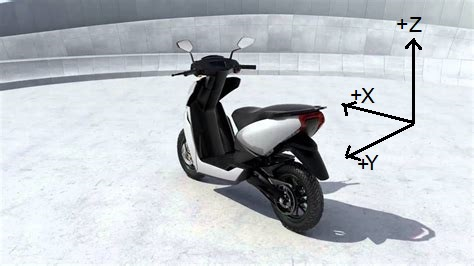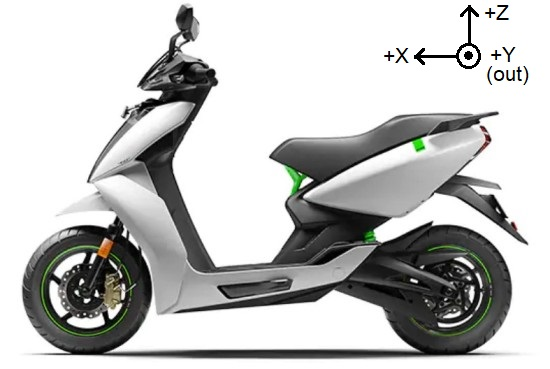
2) We are considering following signal lights: Left Indicator(LI), Right Indicator(RI) and Tail Light(TL).

3) On moving handle bars left or right, it rotates around Z-axis.

4) When it is lean on either side (left or right), it rotates around X-axis.

5) When a speed breaker or some pothole come in the way (move up or down), it rotates around Y-axis.

6) After analaying data, we are setting some thresohold value for left and right turn or up and down movement.

7) If it crosses certain threshold, we consider it as a turn and turn ON the lights according to situation.

8) We are setting a certain value relative to threshold value, so if it falls again under that certain value, we are turning OFF the lights according to situation.

9) For turning in left or right direction, we are taking combination of leaning or rotating around X-axis, and rotating around X-axis.

10) When moving move or down, due to speed breaker or pothole, we are considering rotating around Y-axis.

11) Considering received_ts as timestamp data received at server so excluding it from analysis.


### Importing libraries

In [1]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import datetime

### Reading data from .csv file and coversion into dataframe

In [2]:
df = pd.read_csv("ScooterIMUData.csv")

In [3]:
df

,ts,received_ts,device_uuid,data_item_name,value
0,2021-11-10 12:18:47.150,2021-11-10 12:18:56.856,s_5777,GYR_X_DEG,-0.010051
1,2021-11-10 12:18:47.150,2021-11-10 12:18:56.860,s_5777,GYR_Y_DEG,-0.076319
2,2021-11-10 12:18:47.150,2021-11-10 12:18:56.865,s_5777,GYR_Z_DEG,-0.044205
3,2021-11-10 12:18:47.170,2021-11-10 12:18:56.856,s_5777,GYR_X_DEG,-0.029533
4,2021-11-10 12:18:47.170,2021-11-10 12:18:56.860,s_5777,GYR_Y_DEG,-0.014959
5,2021-11-10 12:18:47.170,2021-11-10 12:18:56.865,s_5777,GYR_Z_DEG,0.058742
6,2021-11-10 12:18:47.190,2021-11-10 12:18:56.856,s_5777,GYR_X_DEG,0.016557
7,2021-11-10 12:18:47.190,2021-11-10 12:18:56.860,s_5777,GYR_Y_DEG,-0.027170
8,2021-11-10 12:18:47.190,2021-11-10 12:18:56.865,s_5777,GYR_Z_DEG,-0.040077
9,2021-11-10 12:18:47.214,2021-11-10 12:18:56.856,s_5777,GYR_X_DEG,0.027539


### Sorting dataframe by timestamp 'ts' first and then by 'data_item_name'

In [4]:
df = df.sort_values(by=['ts','data_item_name'], ascending=[True,True])

### Analysis  & Visualization

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 334467 entries, 212274 to 294477
Data columns (total 5 columns):
ts                334467 non-null object
received_ts       334467 non-null object
device_uuid       334467 non-null object
data_item_name    334467 non-null object
value             334467 non-null float64
dtypes: float64(1), object(4)
memory usage: 15.3+ MB


In [6]:
df['value'].describe()

count    334467.000000
mean         -0.003939
std           0.087412
min          -1.803581
25%          -0.018011
50%          -0.004617
75%           0.008059
max           1.552032
Name: value, dtype: float64

In [7]:
# Calculating timestamp on the basis of data_item_name
list_of_iteration = []
list_of_datetime_obj = []
list_of_GYR_X_timestamps = []
list_of_GYR_Y_timestamps = []
list_of_GYR_Z_timestamps = []
list_of_GYR_X_values = []
list_of_GYR_Y_values = []
list_of_GYR_Z_values = []
partial_list_of_GYR_X_timestamps = []
partial_list_of_GYR_Y_timestamps = []
partial_list_of_GYR_Z_timestamps = []
partial_list_of_GYR_X_values = []
partial_list_of_GYR_Y_values = []
partial_list_of_GYR_Z_values = []
random_timestamp_value = 1.636511e9
lower_random_timestamp_value = 20+random_timestamp_value
upper_random_timestamp_value = 30+random_timestamp_value

for i in range(0,len(df)):
    list_of_iteration.append(i)
    temp_ts = datetime.datetime.strptime(df.iloc[i]['ts'],"%Y-%m-%d %H:%M:%S.%f")
    list_of_datetime_obj.append(temp_ts)
    current_timestamp = datetime.datetime.timestamp(temp_ts)
    
    if df.iloc[i]['data_item_name'] =="GYR_X_DEG":
        list_of_GYR_X_timestamps.append(current_timestamp)
        list_of_GYR_X_values.append(df.iloc[i]['value'])
        if current_timestamp>=lower_random_timestamp_value and current_timestamp<=upper_random_timestamp_value:
            partial_list_of_GYR_X_timestamps.append(current_timestamp)
            partial_list_of_GYR_X_values.append(df.iloc[i]['value'])

    elif df.iloc[i]['data_item_name'] =="GYR_Y_DEG":
        list_of_GYR_Y_timestamps.append(current_timestamp)
        list_of_GYR_Y_values.append(df.iloc[i]['value'])
        if current_timestamp>=lower_random_timestamp_value and current_timestamp<=upper_random_timestamp_value:
            partial_list_of_GYR_Y_timestamps.append(current_timestamp)
            partial_list_of_GYR_Y_values.append(df.iloc[i]['value'])
    
    elif df.iloc[i]['data_item_name'] =="GYR_Z_DEG":
        list_of_GYR_Z_timestamps.append(current_timestamp)
        list_of_GYR_Z_values.append(df.iloc[i]['value'])
        if current_timestamp>=lower_random_timestamp_value and current_timestamp<=upper_random_timestamp_value:
            partial_list_of_GYR_Z_timestamps.append(current_timestamp)
            partial_list_of_GYR_Z_values.append(df.iloc[i]['value'])


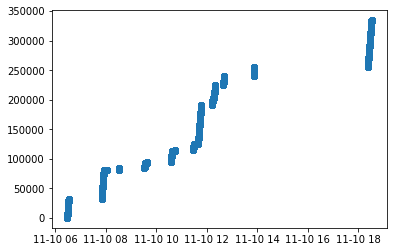

In [8]:
# Graph for iteration vs time, it shows the time at which vehicle was active
dates = matplotlib.dates.date2num(list_of_datetime_obj)
matplotlib.pyplot.plot_date(list_of_datetime_obj,list_of_iteration)


In [9]:
# For every date_item_name, describing the stats for 'value'.
df_list_of_GYR_X_values = pd.DataFrame(list_of_GYR_X_values)
df_list_of_GYR_Y_values = pd.DataFrame(list_of_GYR_Y_values)
df_list_of_GYR_Z_values = pd.DataFrame(list_of_GYR_Z_values)
print("Data item GYR_X_DEG = ",df_list_of_GYR_X_values.describe())
print("Data item GYR_X_DEG = ",df_list_of_GYR_Y_values.describe())
print("Data item GYR_X_DEG = ",df_list_of_GYR_Z_values.describe())

Data item GYR_X_DEG =                     0
count  112166.000000
mean        0.003224
std         0.071595
min        -0.767517
25%        -0.006466
50%         0.003217
75%         0.013131
max         0.713810
Data item GYR_X_DEG =                     0
count  111123.000000
mean       -0.007777
std         0.065673
min        -1.803581
25%        -0.024422
50%        -0.010379
75%         0.004884
max         1.552032
Data item GYR_X_DEG =                     0
count  111178.000000
mean       -0.007330
std         0.115873
min        -1.118546
25%        -0.013582
50%        -0.007003
75%         0.000182
max         1.119323


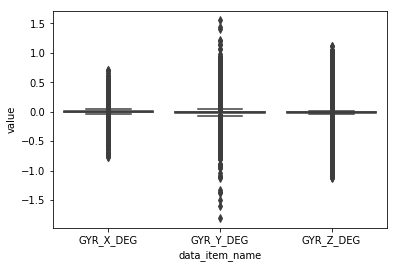

In [10]:
# Box plot according to data_item_name and value
sns.boxplot(x=df['data_item_name'],y=df['value'])

### Plotting graphs for all timestamps

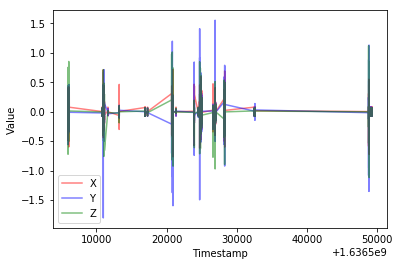

In [11]:
# Overlapped graphs

plt.plot(list_of_GYR_X_timestamps,list_of_GYR_X_values,linestyle = '-',label='X',color='red',alpha=0.5)
plt.plot(list_of_GYR_Y_timestamps,list_of_GYR_Y_values,linestyle = '-',label='Y',color='blue',alpha=0.5)
plt.plot(list_of_GYR_Z_timestamps,list_of_GYR_Z_values,linestyle = '-',label='Z',color='green',alpha=0.5)
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.legend()
plt.show()


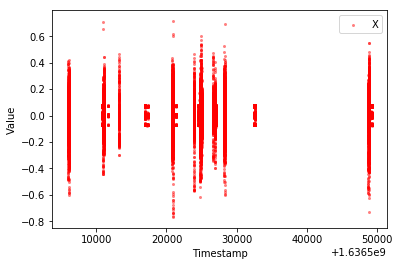

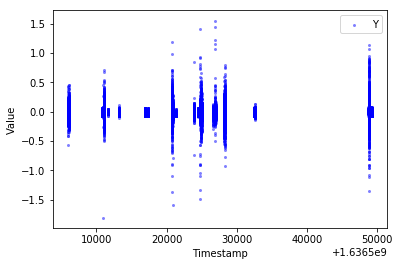

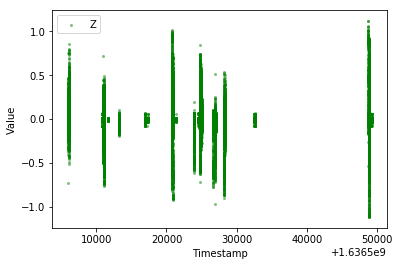

In [12]:
# Individual graphs

plt.scatter(list_of_GYR_X_timestamps,list_of_GYR_X_values,marker = '.',label='X',color='red',alpha=0.5,lw=0)
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.legend()
plt.show()
plt.scatter(list_of_GYR_Y_timestamps,list_of_GYR_Y_values,marker = '.',label='Y',color='blue',alpha=0.5,lw=0)
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.legend()
plt.show()
plt.scatter(list_of_GYR_Z_timestamps,list_of_GYR_Z_values,marker = '.',label='Z',color='green',alpha=0.5,lw=0)
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.legend()
plt.show()

### Plotting graphs for small range of timestamp

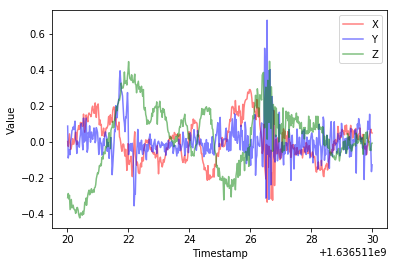

In [13]:
# Overlapped graphs

plt.plot(partial_list_of_GYR_X_timestamps,partial_list_of_GYR_X_values,linestyle = '-',label='X',color='red',alpha=0.5)
plt.plot(partial_list_of_GYR_Y_timestamps,partial_list_of_GYR_Y_values,linestyle = '-',label='Y',color='blue',alpha=0.5)
plt.plot(partial_list_of_GYR_Z_timestamps,partial_list_of_GYR_Z_values,linestyle = '-',label='Z',color='green',alpha=0.5)
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.legend()
plt.show()


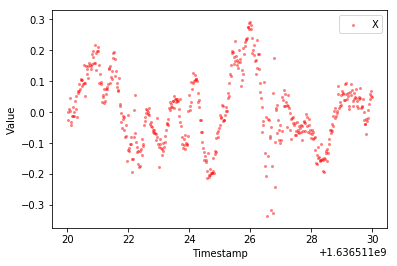

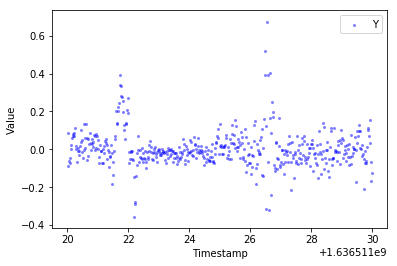

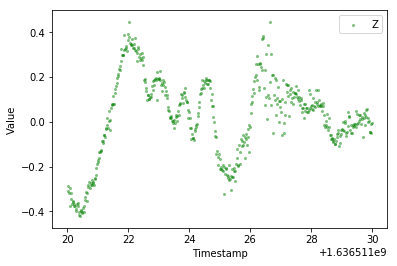

In [14]:
# Individual graphs

plt.scatter(partial_list_of_GYR_X_timestamps,partial_list_of_GYR_X_values,marker = '.',label='X',color='red',alpha=0.5,lw=0)
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.legend()
plt.show()
plt.scatter(partial_list_of_GYR_Y_timestamps,partial_list_of_GYR_Y_values,marker = '.',label='Y',color='blue',alpha=0.5,lw=0)
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.legend()
plt.show()
plt.scatter(partial_list_of_GYR_Z_timestamps,partial_list_of_GYR_Z_values,marker = '.',label='Z',color='green',alpha=0.5,lw=0)
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.legend()
plt.show()


In [15]:
# Setting up rate factor to consider it as threshold for turn, exceeding it will turn ON the lights.
rate_factor = 0.1

"""threshold_GYR_Z_clockwise_right_turn_negative  = Threshold value on rotating in clockwise direction relative to positive Z-axis, 
we are turning right and considering its value as negative.""" 

threshold_GYR_Z_clockwise_right_turn_negative = -rate_factor
threshold_GYR_Z_anti_clockwise_left_turn_positive = rate_factor
threshold_GYR_X_anti_clockwise_right_turn_positive = rate_factor
threshold_GYR_X_clockwise_left_turn_negative = -rate_factor
threshold_GYR_Y_anti_clockwise_down_positive = rate_factor
threshold_GYR_Y_clockwise_up_negative = -rate_factor

# Setting certain division factor for threshold value, falling under which turn OFF the lights.
divide_factor = 2

TL = "OFF"
LI = "OFF"
RI = "OFF"
increment_iteration_by = 3

for i in range(0,len(df),increment_iteration_by):
    TS = df.iloc[i]['ts']
    if df.iloc[i]['data_item_name'] =="GYR_X_DEG" and df.iloc[i+1]['data_item_name'] =="GYR_Y_DEG" and df.iloc[i+2]['data_item_name'] =="GYR_Z_DEG":
     
        if df.iloc[i]['value'] <= threshold_GYR_X_clockwise_left_turn_negative and df.iloc[i+2]['value'] >= threshold_GYR_Z_anti_clockwise_left_turn_positive :
            LI = "ON"
        elif df.iloc[i]['value'] > threshold_GYR_X_clockwise_left_turn_negative/divide_factor and df.iloc[i+2]['value'] < threshold_GYR_Z_anti_clockwise_left_turn_positive/divide_factor :
            LI = "OFF"
        if df.iloc[i]['value'] >= threshold_GYR_X_anti_clockwise_right_turn_positive and df.iloc[i+2]['value'] <= threshold_GYR_Z_clockwise_right_turn_negative:
            RI = "ON"
        elif df.iloc[i]['value'] < threshold_GYR_X_anti_clockwise_right_turn_positive/divide_factor and df.iloc[i+2]['value'] > threshold_GYR_Z_clockwise_right_turn_negative/divide_factor:
            RI = "OFF"
        if df.iloc[i+1]['value'] <= threshold_GYR_Y_clockwise_up_negative or df.iloc[i+1]['value'] >= threshold_GYR_Y_anti_clockwise_down_positive:
            TL = "ON"
        elif df.iloc[i+1]['value'] > threshold_GYR_Y_clockwise_up_negative/divide_factor and df.iloc[i+1]['value'] < threshold_GYR_Y_anti_clockwise_down_positive/divide_factor:
            TL = "OFF"
        increment_iteration_by = 3
    else:
        increment_iteration_by = 1
    print("Iteration = {I}, Timestamp = {TS}, Left Indicator = {LI}, Tail Light = {TL}, Right Indicator = {RI}".format(I = i, TS=TS,LI=LI,TL=TL,RI=RI))
    
    

Iteration = 0, Timestamp = 2021-11-10 06:28:47.417, Left Indicator = OFF, Tail Light = OFF, Right Indicator = OFF
Iteration = 3, Timestamp = 2021-11-10 06:28:47.435, Left Indicator = OFF, Tail Light = OFF, Right Indicator = OFF
Iteration = 6, Timestamp = 2021-11-10 06:28:47.455, Left Indicator = OFF, Tail Light = OFF, Right Indicator = OFF
Iteration = 9, Timestamp = 2021-11-10 06:28:47.474, Left Indicator = OFF, Tail Light = OFF, Right Indicator = OFF
Iteration = 12, Timestamp = 2021-11-10 06:28:47.498, Left Indicator = OFF, Tail Light = OFF, Right Indicator = OFF
Iteration = 15, Timestamp = 2021-11-10 06:28:47.514, Left Indicator = OFF, Tail Light = OFF, Right Indicator = OFF
Iteration = 18, Timestamp = 2021-11-10 06:28:47.534, Left Indicator = OFF, Tail Light = OFF, Right Indicator = OFF
Iteration = 21, Timestamp = 2021-11-10 06:28:47.554, Left Indicator = OFF, Tail Light = OFF, Right Indicator = OFF
Iteration = 24, Timestamp = 2021-11-10 06:28:47.574, Left Indicator = OFF, Tail Ligh